In [1]:
# Basic Template
%load_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import imageio
import cnnbin

In [2]:
block_size = (512,512)
net = cnnbin.CNN_filter(depth=4, start_filts=48, block_size = block_size)
size = net.summary()
print(f'Maximum batch_size ~ {np.floor(4*(1024)**3/size)}')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 48, 256, 256]             480
         MaxPool2d-2         [-1, 48, 128, 128]               0
          DownConv-3  [[-1, 48, 128, 128], [-1, 48, 256, 256]]               0
            Conv2d-4         [-1, 48, 128, 128]          20,784
         MaxPool2d-5           [-1, 48, 64, 64]               0
          DownConv-6  [[-1, 48, 64, 64], [-1, 48, 128, 128]]               0
            Conv2d-7           [-1, 48, 64, 64]          20,784
         MaxPool2d-8           [-1, 48, 32, 32]               0
          DownConv-9  [[-1, 48, 32, 32], [-1, 48, 64, 64]]               0
           Conv2d-10           [-1, 48, 32, 32]          20,784
         DownConv-11  [[-1, 48, 32, 32], [-1, 48, 32, 32]]               0
  ConvTranspose2d-12           [-1, 48, 64, 64]           9,264
           Conv2d-13           [-1, 96, 64, 64]      

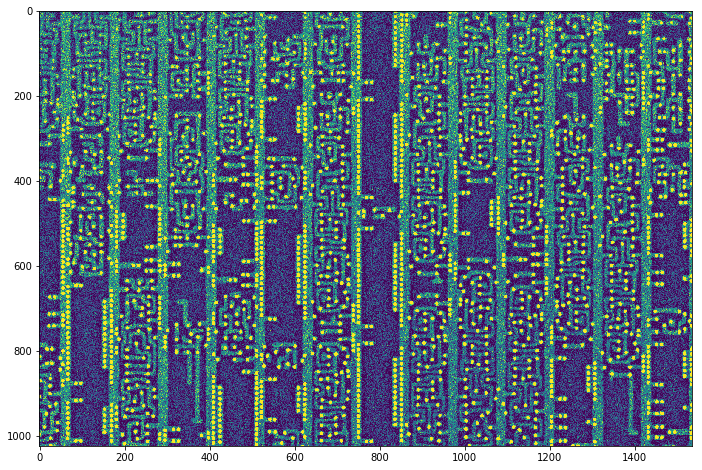

In [3]:
image = imageio.imread('data/baseline2x_125ns.tif')[:-161,:]
binned_mean = np.mean(cnnbin.split_diagonal(image),0)

plt.figure(figsize=(13,8))
plt.imshow(binned_mean)

PSNR (33.1/17.0): 100%|█████| 50/50 [14:37<00:00, 17.56s/it]


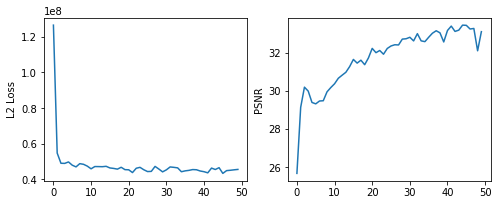

PSNR (33.1/17.0): 100%|█████| 50/50 [13:59<00:00, 16.78s/it]


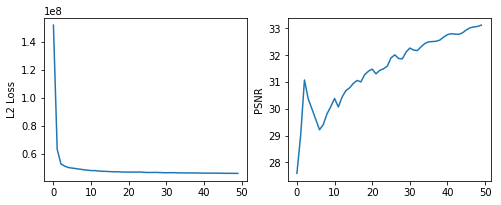

In [4]:
block_size = (512,512)
net = cnnbin.CNN_filter(depth=4, start_filts=48, block_size = block_size)
net2 = cnnbin.CNN_filter(depth=4, start_filts=48, block_size = block_size)

net.train_random(image,num_epochs= 50,batch_size = 6,num_batches =6 , lr=1e-3,alpha = 0.99)
net.plot_train()

net2.train_split(image,num_epochs= 50,batch_size = 6, lr=1e-3,alpha = 0.99)
net2.plot_train()

PSNR (33.9/17.0): 100%|█████| 10/10 [02:52<00:00, 17.21s/it]


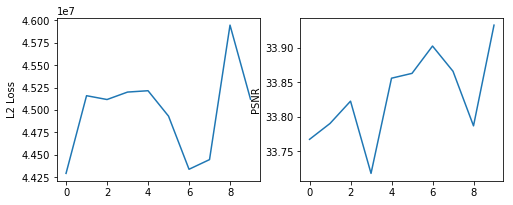

PSNR (33.5/17.0): 100%|█████| 10/10 [02:44<00:00, 16.47s/it]


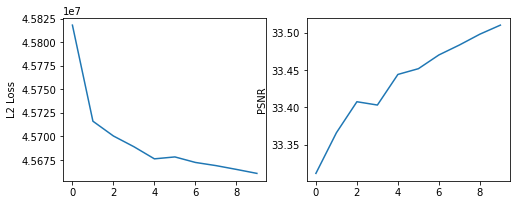

In [9]:
net.train_random(image,num_epochs= 10,batch_size = 6,num_batches =6 , lr=1e-4,alpha = 0.99)
net.plot_train()

net2.train_split(image,num_epochs= 10,batch_size = 6, lr=1e-4,alpha = 0.99)
net2.plot_train()

100%|███████████████████████| 35/35 [00:05<00:00,  6.20it/s]


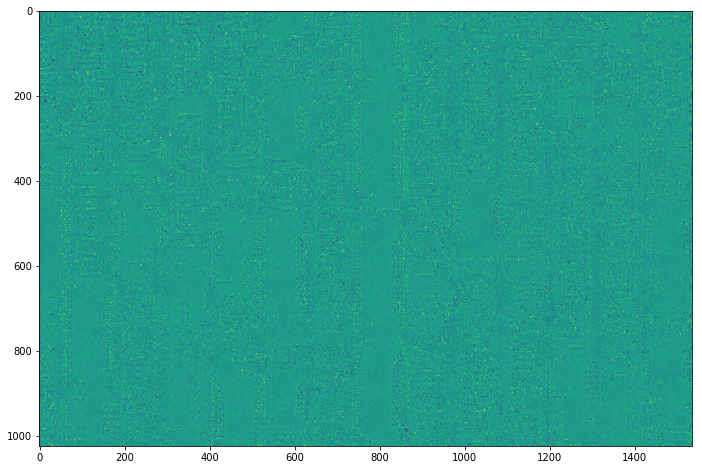

In [10]:
image_filter_random = net.filter(image,sampling=1.1)
image_filter_split = net2.filter(image,sampling=1.1)
plt.figure(figsize=(15,8))
plt.imshow(image_filter_random-image_filter_split)

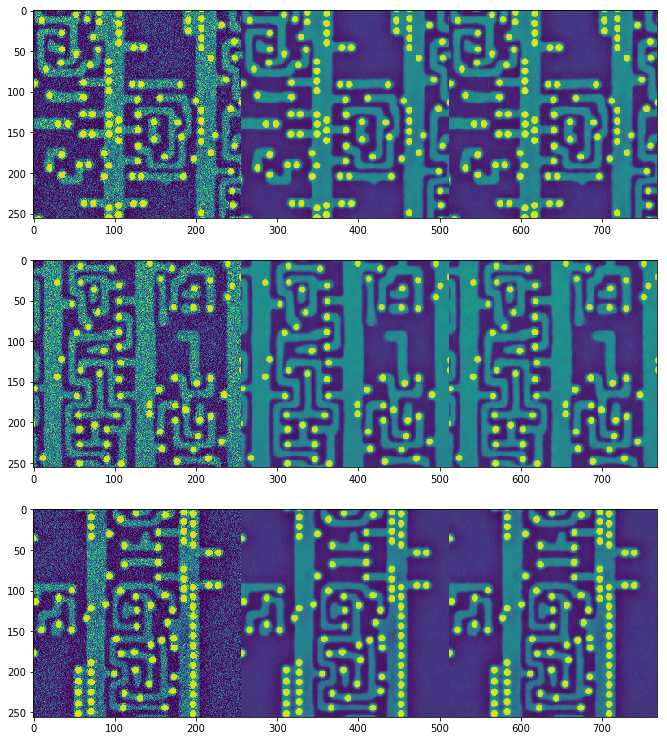

In [14]:
from cnnbin.utils import random_patches

block_size = (256,256)
n_patches = 3
seed = 3421
ref = random_patches(binned_mean, block_size, n_patches, seed)
filtered_random = random_patches(image_filter_random, block_size, n_patches, seed)
filtered_split = random_patches(image_filter_split, block_size, n_patches, seed)
W = 13
plt.figure(figsize=(W,n_patches*W/3))
for i in range(n_patches):
    plt.subplot(n_patches,1,1+i)    
    plt.imshow(np.concatenate((ref[i],filtered_random[i],filtered_split[i]),1))
    
    

PSNR (32.9/22.6): 100%|███████| 2/2 [00:03<00:00,  1.92s/it]


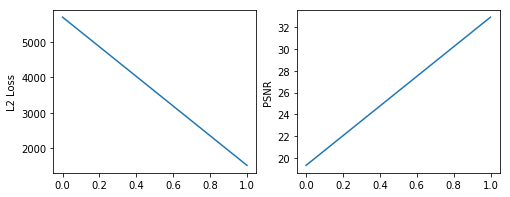

PSNR (36.5/22.7): 100%|███████| 2/2 [00:03<00:00,  1.65s/it]


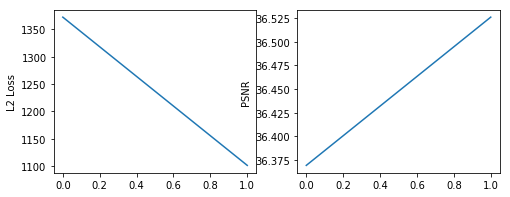

NameError: name 'split_diagonal' is not defined

In [2]:
net.train_random(image,num_epochs= 10,batch_size = 4,num_batches = 10, lr=1e-4,alpha = 0.99)
net.plot_train()

im_ref = np.mean(split_diagonal(image_ref),0)
image_bin = np.mean(split_diagonal(image),0)
image_filter_fuse = net.filter(image,sampling=1.01)
image_filter = net.filter_patch(image)

### Gray value image

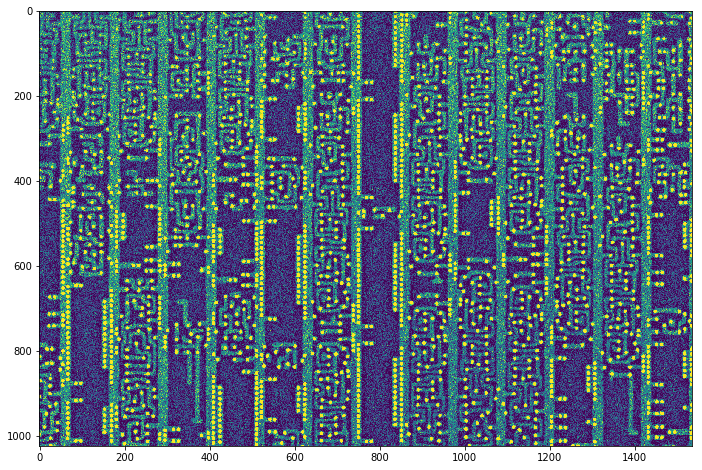

In [19]:
block_size = (256,256)
net = cnnbin.CNN_filter(depth=4, start_filts=48, block_size = block_size)
# net.model.summary((1,*block_size))

TypeError: super(type, obj): obj must be an instance or subtype of type

In [8]:

net.train_random(image,num_epochs= 20,batch_size = 6,num_batches = 2, lr=1e-3,alpha = 0.99)
net.plot_train()

net.train_random(image,num_epochs= 20,batch_size = 6,num_batches = 2, lr=1e-4,alpha = 0.99)
net.plot_train()

im_ref = np.mean(split_diagonal(image_ref),0)
image_bin = np.mean(split_diagonal(image),0)
image_filter_fuse = net.filter(image,sampling=1.01)
image_filter = net.filter_patch(image)

plt.figure(figsize=(13,5))
for i,im in enumerate([binned_mean,image_filter,image_filter_fuse]):
    plt.subplot(1,3,1+i)    
    plt.imshow(np.clip(binned_ref/255,0,1))
    plt.title(f'PSNR {psnr(im,im_ref):.2f}')

AssertionError: Image shape must be divisible by 2

PSNR (34.8/22.7): 100%|█████| 20/20 [00:28<00:00,  1.45s/it]


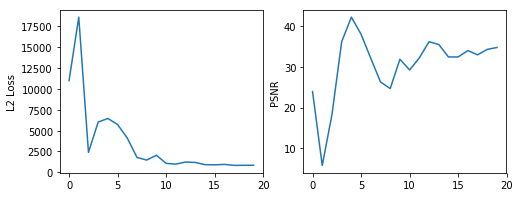

PSNR (32.7/22.7): 100%|█████| 20/20 [00:28<00:00,  1.43s/it]


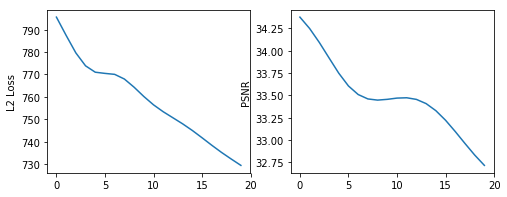

100%|███████████████████████| 12/12 [00:00<00:00, 22.65it/s]


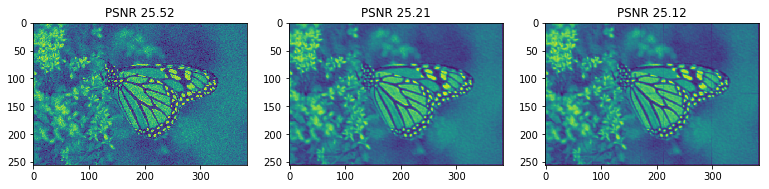

In [40]:
net2 = cnnbin.CNN_filter(depth=4, start_filts=48, block_size = block_size)
net2.train_split(image,num_epochs= 20,batch_size = 12, lr=1e-3,alpha = 0.99)
net2.plot_train()
net2.train_split(image,num_epochs= 20,batch_size = 12, lr=1e-4,alpha = 0.99)
net2.plot_train()

image_filter_fuse = net2.filter(image,sampling=1.01)
image_filter = net2.filter_patch(image)

plt.figure(figsize=(13,5))
for i,im in enumerate([image_bin,image_filter,image_filter_fuse]):
    plt.subplot(1,3,1+i)    
    plt.imshow(np.clip(im/255,0,1))
    plt.title(f'PSNR {psnr(im,im_ref):.2f}')

### Color image

In [50]:
sigma = 30
image_ref =imageio.imread('data/monarch.bmp')
image = image_ref+sigma * np.random.standard_normal(image_ref.shape)
block_size = (256,256)

binned_ref = np.mean(cnnbin.split_diagonal_rgb(image_ref),0)
binned_mean = np.mean(cnnbin.split_diagonal_rgb(image),0)

In [ ]:
net = cnnbin.CNN_filter(multichannel = True, depth=4, start_filts=48, block_size = block_size)

net.train_random(image,num_epochs= 20,batch_size = 6,num_batches = 2, lr=1e-3,alpha = 0.99)
net.plot_train()

In [ ]:
net.train_random(image,num_epochs= 20,batch_size = 6,num_batches = 2, lr=1e-4,alpha = 0.99)
net.plot_train()

image_filter_fuse = net.filter(image,sampling=1.01)
image_filter = net.filter_patch(image)

plt.figure(figsize=(13,5))
for i,im in enumerate([binned_mean,image_filter,image_filter_fuse]):
    plt.subplot(1,3,1+i)    
    plt.imshow(np.clip(im/255,0,1))
    plt.title(f'PSNR {psnr(im,binned_ref):.2f}')

PSNR (31.0/22.8):  55%|██▊  | 11/20 [00:17<00:13,  1.55s/it]

In [ ]:
net2 = cnnbin.CNN_filter(multichannel = True, depth=4, start_filts=48, block_size = block_size)

net2.train_split(image,num_epochs= 20,batch_size = 12, lr=1e-3,alpha = 0.99)
net2.plot_train()

In [ ]:
net2.train_split(image,num_epochs= 20,batch_size = 12, lr=1e-4,alpha = 0.99)
net2.plot_train()

image_filter_fuse = net2.filter(image,sampling=1.01)
image_filter = net2.filter_patch(image)

plt.figure(figsize=(13,5))
for i,im in enumerate([binned_mean,image_filter,image_filter_fuse]):
    plt.subplot(1,3,1+i)    
    plt.imshow(np.clip(im/255,0,1))
    plt.title(f'PSNR {psnr(im,binned_ref):.2f}')

In [20]:
FOLDER = 'd:/2018/DMSEA/'
image = imageio.imread(FOLDER + 'baseline2x_125ns.tif')[:-161,:]
print(image.shape)

block_size = (512,512)
net = cnnbin.CNN_filter(depth=4, start_filts=48, block_size = block_size)

(2046, 3072)


loss 8.49e+07 PSNR (30.8/17.5): 100%|█| 100/100 [00:52<00:00,  1.91it/s]


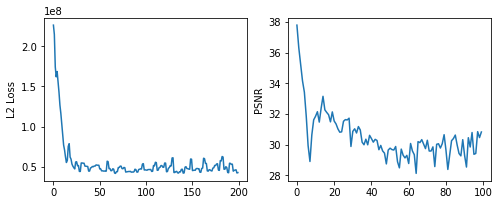

In [21]:
net.train_random(image,num_epochs= 100,batch_size = 1, lr=1e-4,alpha = 0.99)
net.plot_train()

In [23]:
net.train_split(image,sampling = 1.1,num_epochs= 100, lr=1e-4,alpha = 0.99)

AttributeError: 'CNN_filter' object has no attribute 'train_split'

100%|███████████████████████| 35/35 [00:05<00:00,  6.07it/s]


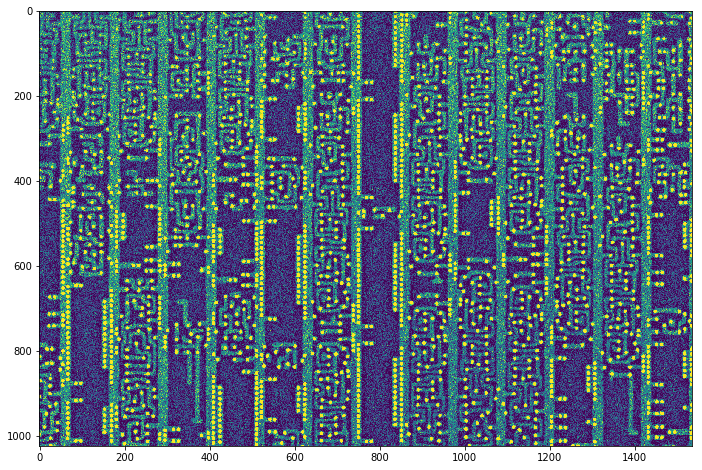

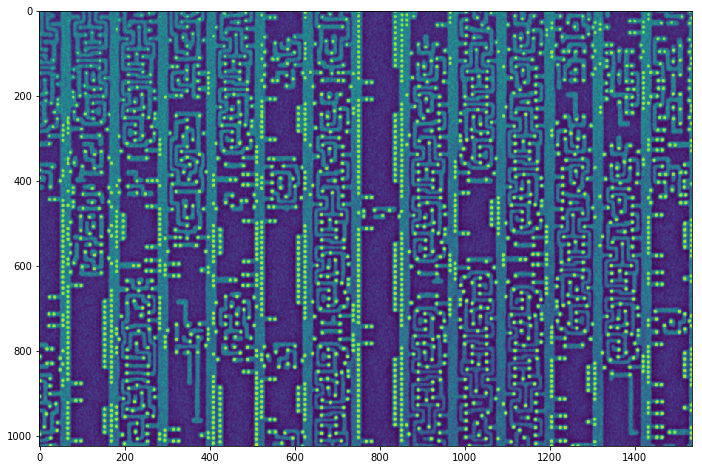

In [22]:
from cnnbin.utils import split_diagonal
image_bin = np.mean(split_diagonal(image),0)
image_filter_fuse = net.filter(image,sampling=1.1)

plt.figure(figsize=(13,8))
plt.imshow(image_bin)

plt.figure(figsize=(13,8))
plt.imshow(image_filter_fuse)

imageio.imsave('baseline2x_125ns_filter1.tiff',image_filter_fuse.astype('uint16'))
imageio.imsave('baseline2x_125ns_bin.tiff',image_bin.astype('uint16'))

In [137]:
a = None
print(a is None)
print(a is not None)

True
False


['baseline2x_125ns.tif', 'baseline_50000ns.tif', 'baseline_500ns.tif', 'results', 'result_filter', 'set2']
24 patches
(24, 512, 512)
(24, 256, 256)


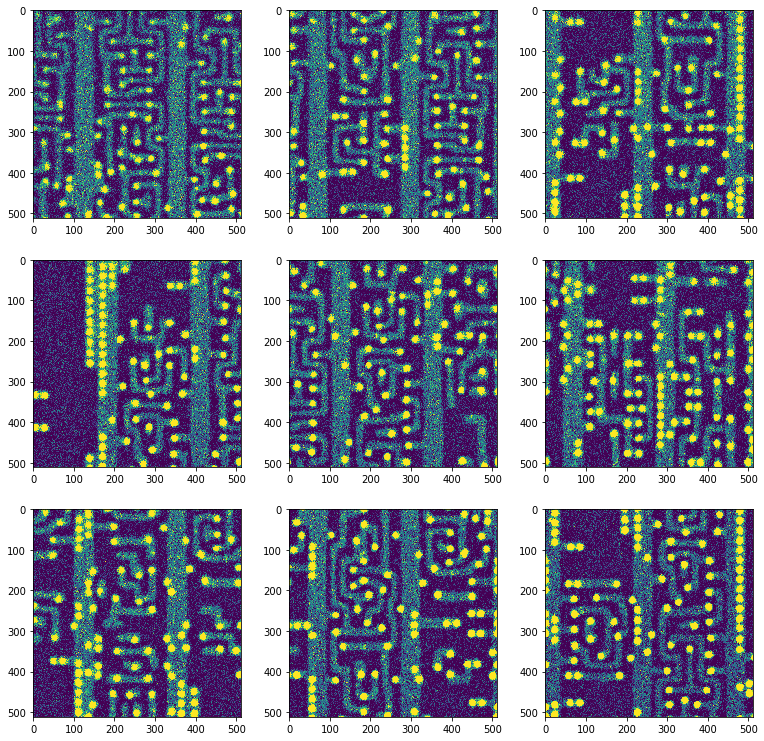

In [2]:
from sklearn.feature_extraction.image import extract_patches_2d
from cnnbin.patches import split

FOLDER = 'd:/2018/DMSEA/'
print(os.listdir(FOLDER))
image = imageio.imread(FOLDER + 'baseline2x_125ns.tif')[:-161,:]
block_size = (512,512)
sampling = 1.0
patches = split(image,block_size,sampling = sampling)
print(f'{len(patches)} patches')

plt.figure(figsize=(13,13))
for i,im in enumerate(patches[:9]):
    plt.subplot(3,3,1+i)
    plt.imshow(im)
plt.savefig('sem_input')
    
stack = np.array(patches)
print(stack.shape)
stack1,stack2 = cnnbin.utils.split_stack(stack)
print(stack1.shape)

In [13]:
net = cnnbin.CNN_filter(depth=4, start_filts=48)

PSNR (27.6/11.0): 100%|█████| 10/10 [03:19<00:00, 19.99s/it]


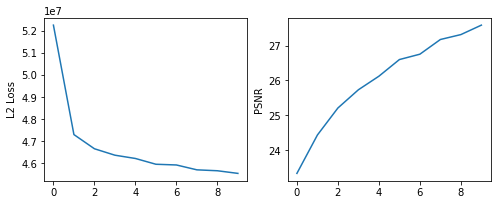

PSNR (28.7/11.0): 100%|█████| 10/10 [03:18<00:00, 19.81s/it]


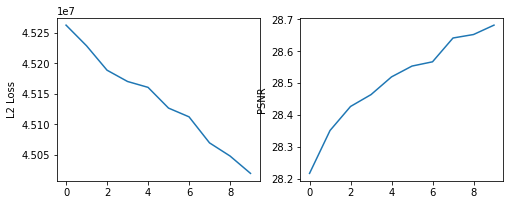

In [14]:
net.train_stack(stack1,stack2,num_epochs= 10,lr=1e-3,alpha = 0.99)
net.plot_train()
net.train_stack(stack1,stack2,num_epochs= 10,lr=1e-4,alpha = 0.99)
net.plot_train()

40 patches
(40, 512, 512)


100%|███████████████████████| 40/40 [00:06<00:00,  5.99it/s]


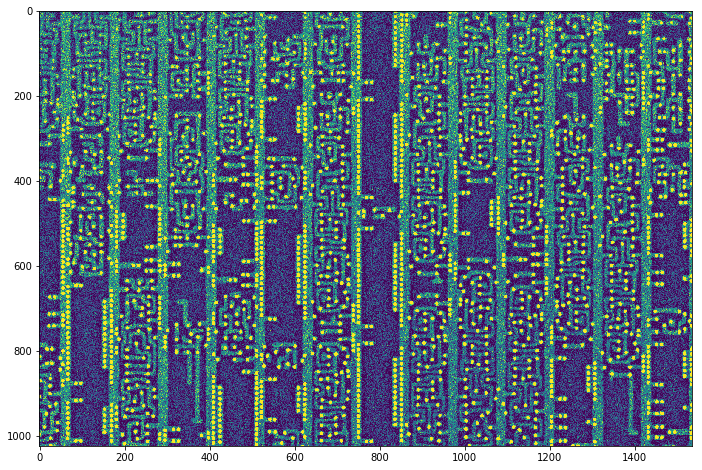

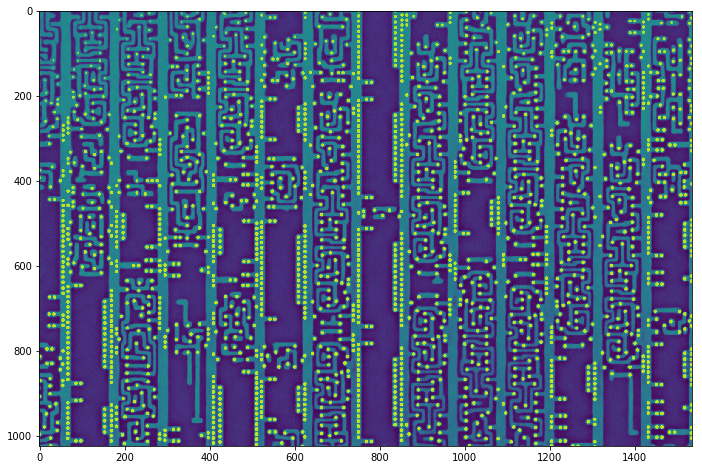

In [15]:
from scipy.signal.windows import hann
from cnnbin.patches import split, combine

block_size = (512,512)
sampling = 1.2
patches = split(image,block_size,sampling = sampling,ind_div = 2)
print(f'{len(patches)} patches')
stack = np.array(patches)
print(stack.shape)
stack1,stack2 = cnnbin.utils.split_stack(stack)
stack_out = net.filter_stack(stack1,stack2)
stack_mean = 0.5*(stack1+stack2)

bin_shape = [d//2 for d in image.shape]
bin_block_size = [d//2 for d in block_size]

stitched_mean = combine(stack_mean, bin_block_size, bin_shape, sampling=sampling,windowfunc=hann)
stitched_cnn = combine(stack_out, bin_block_size, bin_shape, sampling=sampling,windowfunc=hann)

plt.figure(figsize=(13,8))
plt.imshow(stitched_mean)
plt.figure(figsize=(13,8))
plt.imshow(stitched_cnn)


imageio.imsave('baseline2x_125ns_filter_stack.tiff',stitched_cnn.astype('uint16'))
imageio.imsave('baseline2x_125ns_bin.tiff',stitched_mean.astype('uint16'))

[([0, 306, 614, 920, 1228, 1534], [512, 818, 1126, 1432, 1740, 2046]), ([0, 320, 640, 960, 1280, 1600, 1920, 2240, 2560], [512, 832, 1152, 1472, 1792, 2112, 2432, 2752, 3072])]
54 patches
(54, 512, 512)


100%|███████████████████████| 54/54 [00:09<00:00,  6.00it/s]


[([0, 153, 307, 460, 614, 767], [256, 409, 563, 716, 870, 1023]), ([0, 160, 320, 480, 640, 800, 960, 1120, 1280], [256, 416, 576, 736, 896, 1056, 1216, 1376, 1536])]
[([0, 153, 307, 460, 614, 767], [256, 409, 563, 716, 870, 1023]), ([0, 160, 320, 480, 640, 800, 960, 1120, 1280], [256, 416, 576, 736, 896, 1056, 1216, 1376, 1536])]


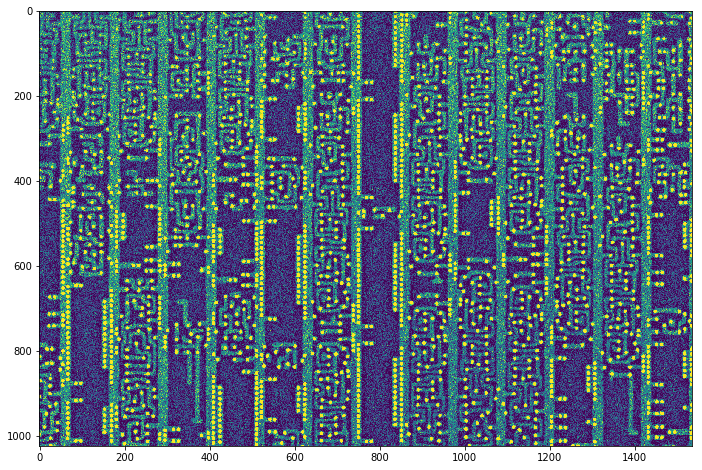

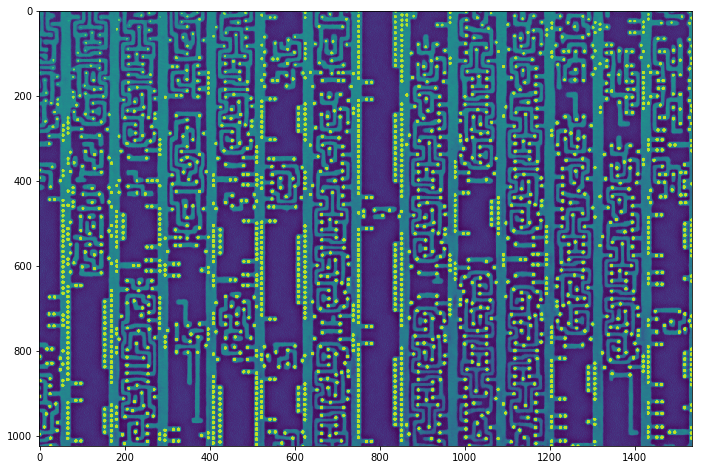

In [135]:
from scipy.signal.windows import hann

block_size = (512,512)
sampling = 1.5
patches = split(image,block_size,sampling = sampling,ind_div = 2)
print(f'{len(patches)} patches')
stack = np.array(patches)
print(stack.shape)
stack1,stack2 = cnnbin.utils.split_stack(stack)
stack_out = net.filter_stack(stack1,stack2)
stack_mean = 0.5*(stack1+stack2)

bin_shape = [d//2 for d in image.shape]
bin_block_size = [d//2 for d in block_size]

stitched_mean = combine(stack_mean, bin_block_size, bin_shape, sampling=sampling,windowfunc=hann)
stitched_cnn = combine(stack_out, bin_block_size, bin_shape, sampling=sampling,windowfunc=hann)

plt.figure(figsize=(13,8))
plt.imshow(stitched_mean)
plt.figure(figsize=(13,8))
plt.imshow(stitched_cnn)


imageio.imsave('baseline2x_125ns_filter_s2.tiff',stitched_cnn.astype('uint16'))
imageio.imsave('baseline2x_125ns_bin.tiff',stitched_mean.astype('uint16'))

In [121]:
print(image.shape)

(2047, 3072)


In [8]:
im1,im2 = cnnbin.utils.split_diagonal(image[:1024,:1024])
print(im1.shape)
print(np.mean(image))
print(np.mean(im1))
print(np.mean(im2))
im_filter = net.train(im1,im2,num_epochs= 1,lr=1e-4)

imageio.imsave('baseline2x_125ns_filter.tiff',im_filter.astype('uint16'))
imageio.imsave('baseline2x_125ns_bin.tiff',((im1+im2)/2).astype('uint16'))

(2006, 3072)
(512, 512)
16420.91752476944
6150.699353218079
6148.740922927856


PSNR (27.5/10.0): 100%|███████| 1/1 [00:01<00:00,  1.91s/it]


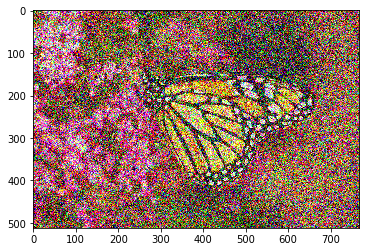

In [3]:
from cnnbin.utils import split_rgb
folder = 'd:/2018/CNN_denoise/set14/'
image = imageio.imread(folder + 'monarch.bmp')
noisy = image + 100 * np.random.standard_normal(image.shape)
im1,im2 = split_rgb(noisy,mode = 'diag')
ref = np.mean(split_rgb(image,mode = 'all'),0)
net = cnnbin.CNN_filter(in_channels=3)
plt.imshow(clipto8bit(noisy))


In [ ]:
im_filter = net.train(im1,im2,num_epochs= 50,lr=1e-3)
im_filter = net.train(im1,im2,num_epochs= 100,lr=1e-4)
plt.figure(figsize=(15,13))
for i,im in enumerate([(im1+im2)/4,im_filter/2]):
    plt.subplot(1,2,1+i)
    plt.imshow(clipto8bit(im))    
    plt.title('{}'.format(compare_psnr(clipto8bit(ref),clipto8bit(im))))

In [ ]:
im_filter = net.train(im1,im2,num_epochs= 100,lr=1e-4)
plt.figure(figsize=(15,13))
for i,im in enumerate([(im1+im2)/4,im_filter/2]):
    plt.subplot(1,2,1+i)
    plt.imshow(clipto8bit(im))    
    plt.title('{}'.format(compare_psnr(clipto8bit(ref),clipto8bit(im))))